# Data Import

Data Source: https://www.kaggle.com/praveengovi/emotions-dataset-for-nlp

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [2]:
train_data = pd.read_csv('Data/train.txt', sep=';', names=['text', 'emotion'])
train_data.head()

,text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


In [3]:
test_data = pd.read_csv('Data/test.txt', sep=';', names=['text', 'emotion'])
test_data.head()

,text,emotion
0,im feeling rather rotten so im not very ambiti...,sadness
1,im updating my blog because i feel shitty,sadness
2,i never make her separate from me because i do...,sadness
3,i left with my bouquet of red and yellow tulip...,joy
4,i was feeling a little vain when i did this one,sadness


In [4]:
val_data = pd.read_csv('Data/test.txt', sep=';', names=['text', 'emotion'])
val_data.head()

,text,emotion
0,im feeling rather rotten so im not very ambiti...,sadness
1,im updating my blog because i feel shitty,sadness
2,i never make her separate from me because i do...,sadness
3,i left with my bouquet of red and yellow tulip...,joy
4,i was feeling a little vain when i did this one,sadness


# Basic EDA

1. How much data do I have?

In [5]:
len(train_data), len(test_data), len(val_data)

(16000, 2000, 2000)

2. Does the data have any null values?

In [6]:
if not train_data.isna().sum().any() and not test_data.isna().sum().any():
    print("No Null Values detected")
else:
    print("Null Values detected")

No Null Values detected


3. What is the distribution of 'emotions' in the dataset?

In [7]:
emotions_order = list(train_data.emotion.unique())
emotions_order

['sadness', 'anger', 'love', 'surprise', 'fear', 'joy']

In [8]:
emotions_color = ['blue', 'red', 'pink', 'green', 'grey', 'yellow']

In [9]:
dict_emo_color = {}
for each_emo, each_color in zip(emotions_order, emotions_color):
    dict_emo_color[each_emo] = each_color
    
dict_emo_color

{'sadness': 'blue',
 'anger': 'red',
 'love': 'pink',
 'surprise': 'green',
 'fear': 'grey',
 'joy': 'yellow'}

In [10]:
fig = px.histogram(train_data,
                   x="emotion",
                   template='plotly_white',
                   color='emotion',
                   category_orders = {'emotion': emotions_order}
                  )
fig.update_layout(
    title={
        'text': "Row Count of <b>Train Data</b> by Emotion Tags",
        'x' : 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

In [11]:
fig = px.histogram(test_data,
                   x="emotion",
                   template='plotly_white',
                   color='emotion',
                   category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "Row Count of <b>Test Data</b> by Emotion Tags",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

4. What words occur most frequently?

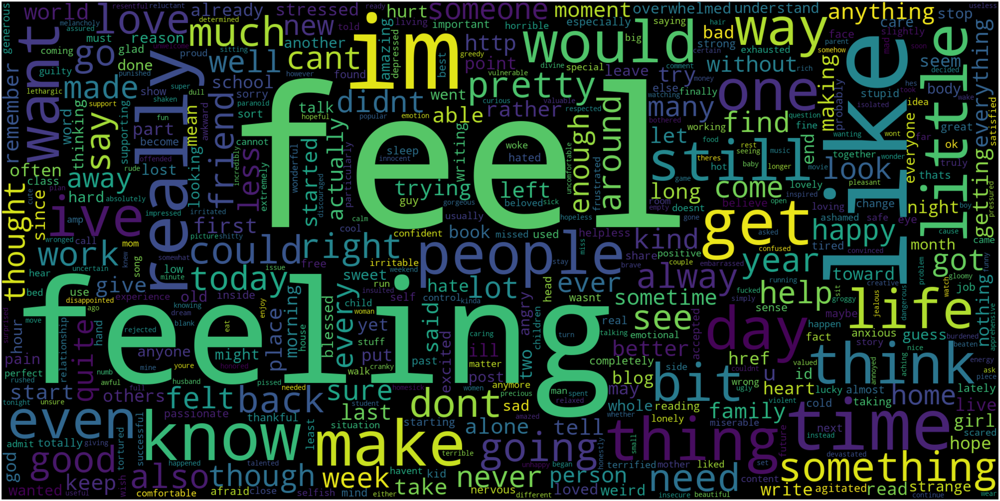

In [59]:
from wordcloud import WordCloud
from nltk.corpus import stopwords

set_stop_words = set(stopwords.words("english"))
wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=500,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = set_stop_words,
                      include_numbers=False).generate(" ".join(list(train_data.text)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

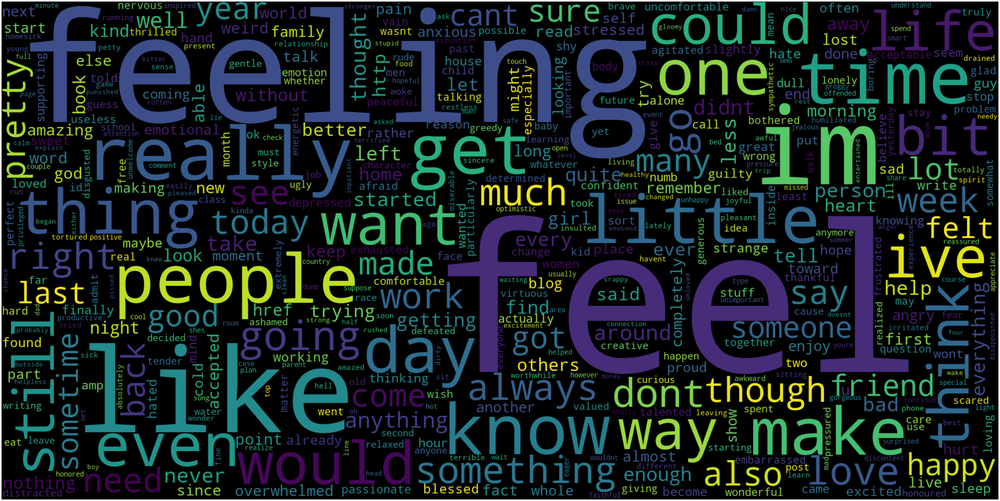

In [13]:
wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=500,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = set_stop_words,
                      include_numbers=False).generate(" ".join(list(test_data.text)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

5. Length Analysis

In [14]:
train_data['length_text'] = train_data.text.apply(len)
test_data['length_text'] = test_data.text.apply(len)

In [15]:
train_data.head()

,text,emotion,length_text
0,i didnt feel humiliated,sadness,23
1,i can go from feeling so hopeless to so damned...,sadness,108
2,im grabbing a minute to post i feel greedy wrong,anger,48
3,i am ever feeling nostalgic about the fireplac...,love,92
4,i am feeling grouchy,anger,20


In [16]:
fig = px.box(train_data,
             x='emotion',
             y='length_text',
             color='emotion',
             category_orders={'emotion': emotions_order})
fig.show()

In [17]:
fig = px.box(test_data,
             x='emotion',
             y='length_text',
             color='emotion',
             category_orders={'emotion': emotions_order})
fig.show()

6. Sentiment Analysis

In [18]:
from transformers import pipeline
sentiment_analysis_pipeline = pipeline("sentiment-analysis")

C:\Users\nroy0\anaconda3\lib\site-packages\torchaudio\extension\extension.py:13: UserWarning:

torchaudio C++ extension is not available.

C:\Users\nroy0\anaconda3\lib\site-packages\torchaudio\backend\utils.py:89: UserWarning:

No audio backend is available.



In [19]:
train_data['sentiment_hf'] = train_data.text.apply(sentiment_analysis_pipeline)
test_data['sentiment_hf'] = test_data.text.apply(sentiment_analysis_pipeline)

In [20]:
train_data.head()

,text,emotion,length_text,sentiment_hf
0,i didnt feel humiliated,sadness,23,"[{'label': 'POSITIVE', 'score': 0.891336262226..."
1,i can go from feeling so hopeless to so damned...,sadness,108,"[{'label': 'POSITIVE', 'score': 0.966550827026..."
2,im grabbing a minute to post i feel greedy wrong,anger,48,"[{'label': 'NEGATIVE', 'score': 0.999305427074..."
3,i am ever feeling nostalgic about the fireplac...,love,92,"[{'label': 'POSITIVE', 'score': 0.965797126293..."
4,i am feeling grouchy,anger,20,"[{'label': 'NEGATIVE', 'score': 0.999391376972..."


In [21]:
train_data['sentiment_hf'] = train_data['sentiment_hf'].apply(lambda x : x[0]['label'])
test_data['sentiment_hf'] = test_data['sentiment_hf'].apply(lambda x : x[0]['label'])

In [22]:
fig = px.histogram(train_data,
             x="emotion",
             template='plotly_white',
             color='sentiment_hf',
             category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "Row Count of <b>Test Data</b> by Emotion Tags",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

# Data Preparation

## Label Encoding

In [23]:
train_data["emotion"] = train_data["emotion"].astype('category')
train_data["emotion_label"] = train_data["emotion"].cat.codes
train_data.head()

,text,emotion,length_text,sentiment_hf,emotion_label
0,i didnt feel humiliated,sadness,23,POSITIVE,4
1,i can go from feeling so hopeless to so damned...,sadness,108,POSITIVE,4
2,im grabbing a minute to post i feel greedy wrong,anger,48,NEGATIVE,0
3,i am ever feeling nostalgic about the fireplac...,love,92,POSITIVE,3
4,i am feeling grouchy,anger,20,NEGATIVE,0


In [24]:
test_data["emotion"] = test_data["emotion"].astype('category')
test_data["emotion_label"] = test_data["emotion"].cat.codes
test_data.head()

,text,emotion,length_text,sentiment_hf,emotion_label
0,im feeling rather rotten so im not very ambiti...,sadness,59,NEGATIVE,4
1,im updating my blog because i feel shitty,sadness,41,NEGATIVE,4
2,i never make her separate from me because i do...,sadness,97,POSITIVE,4
3,i left with my bouquet of red and yellow tulip...,joy,113,POSITIVE,2
4,i was feeling a little vain when i did this one,sadness,47,NEGATIVE,4


## Text Data Preparation

1. Train Test Split

In [28]:
import tensorflow as tf

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

from sklearn.model_selection import train_test_split

In [178]:
train_features, train_labels = train_data['text'], train_data['emotion_label']
test_features, test_labels = test_data['text'], test_data['emotion_label']

In [83]:
train_features[:5]

0                              i didnt feel humiliated
1    i can go from feeling so hopeless to so damned...
2     im grabbing a minute to post i feel greedy wrong
3    i am ever feeling nostalgic about the fireplac...
4                                 i am feeling grouchy
Name: text, dtype: object

In [84]:
train_labels[:5]

0    4
1    4
2    0
3    3
4    0
Name: emotion_label, dtype: int8

2. Analyze and select max_len

In [85]:
from nltk.tokenize import word_tokenize
tokenized_train_features = [word_tokenize(each_train_text) for each_train_text in train_features]

In [86]:
list_len_text_by_words = [len(each_tokenized_text) for each_tokenized_text in tokenized_train_features]

In [87]:
fig = px.histogram(
    x=list_len_text_by_words,
    template='plotly_white'
)
fig.update_layout(
    title={
        'text': "Histogram of <b>Sentence Length</b> by Number of Words",
        'x': 0.4,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Frequency').update_xaxes(
    title='Length of Sentences by Words')
fig.update_layout(showlegend=False)
fig.update_layout(hovermode='x')
fig.show()

In [102]:
# set_train_tokens = set([
#     each_token for each_tokenized_text in tokenized_train_features
#     for each_token in each_tokenized_text
# ])

# len(set_train_tokens - set_stop_words)

# vocab_size = 10000
# max_seq_len = 20

In [90]:
import nltk
from gensim.models import word2vec

In [95]:
print(tokenized_train_features[:2])

[['i', 'didnt', 'feel', 'humiliated'], ['i', 'can', 'go', 'from', 'feeling', 'so', 'hopeless', 'to', 'so', 'damned', 'hopeful', 'just', 'from', 'being', 'around', 'someone', 'who', 'cares', 'and', 'is', 'awake']]


In [103]:
vector_size = 300

In [104]:
w2v_model = word2vec.Word2Vec(
    tokenized_train_features,
    vector_size=vector_size,  # Dimensionality of the word vectors
    window=20,
    min_count=1,
    sg=1  # 1 for skip-gram; otherwise CBOW
)
w2v_model

In [97]:
len(w2v_model.wv)

15210

In [99]:
w2v_model.wv.most_similar('sad', topn=10)

[('lonely', 0.9261837601661682),
 ('bitchy', 0.9099941849708557),
 ('horribly', 0.9092167019844055),
 ('insecure', 0.902162492275238),
 ('coz', 0.9018257260322571),
 ('terrible', 0.9003391265869141),
 ('unhappy', 0.8994545340538025),
 ('needy', 0.8943964838981628),
 ('worried', 0.8941110372543335),
 ('angry', 0.8923036456108093)]

In [117]:
vocab_size = len(w2v_model.wv)
max_len = 20
embedding_matrix = w2v_model.wv[vocab]

In [244]:
vocab_size, vector_size, max_seq_len

(15210, 300, 20)

In [131]:
w2v_model.wv.get_index('has')

97

In [190]:
out_of_vocab_index = len(w2v_model.wv.key_to_index)
out_of_vocab_index

15212

In [191]:
w2v_model.wv.key_to_index['<OOV>'] = out_of_vocab_index

In [192]:
def w2v_indexed_token_sequences(w2v_model, list_features):
    indexed_features = []
    for each_seq in list_features:
        list_token_indices = []
        for each_token in each_seq:
            try:
                list_token_indices.append(w2v_model.wv.key_to_index[each_token])
            except KeyError as e:
                list_token_indices.append(out_of_vocab_index)
        indexed_features.append(list_token_indices)
    return indexed_features

In [193]:
indexed_train_features = w2v_indexed_token_sequences(w2v_model, tokenized_train_features)

tokenized_test_features = [word_tokenize(each_test_text) for each_test_text in test_features]
indexed_test_features = w2v_indexed_token_sequences(w2v_model, tokenized_test_features)

len(indexed_train_features), len(indexed_test_features)

(16000, 2000)

In [194]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

padded_train = pad_sequences(indexed_train_features, padding = 'post', maxlen=max_seq_len, truncating='post')
padded_test = pad_sequences(indexed_test_features, padding = 'post', maxlen=max_seq_len, truncating='post')

In [200]:
list_len_text_by_words = [len(each) for each in padded_train]

fig = px.histogram(
    x=list_len_text_by_words,
    template='plotly_white'
)
fig.update_layout(
    title={
        'text': "Histogram of <b>Sentence Length</b> by Number of Words",
        'x': 0.4,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Frequency').update_xaxes(
    title='Length of Sentences by Words')
fig.update_layout(showlegend=False)
fig.update_layout(hovermode='x')
fig.show()

In [248]:
from keras.layers import Dropout

def get_model():
    model = Sequential()
    model.add(
        Embedding(input_dim=vocab_size,
                  output_dim=vector_size,
                  weights=[embedding_matrix],
                  input_length=max_seq_len))
    model.add(Dropout(0.6))
    model.add(LSTM(max_seq_len,return_sequences=True))
    model.add(LSTM(6))
    model.add(Dense(6,activation='softmax'))
    return model

In [249]:
model = get_model()
model.summary()

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_19 (Embedding)     (None, 20, 300)           4563000   
_________________________________________________________________
dropout_15 (Dropout)         (None, 20, 300)           0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 20, 20)            25680     
_________________________________________________________________
lstm_11 (LSTM)               (None, 6)                 648       
_________________________________________________________________
dense_11 (Dense)             (None, 6)                 42        
Total params: 4,589,370
Trainable params: 4,589,370
Non-trainable params: 0
_________________________________________________________________


In [250]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

In [251]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
tf.config.run_functions_eagerly(True)
history = model.fit(padded_train, 
                    pd.get_dummies(train_labels), 
                    epochs=10)

Epoch 1/10
500/500 [==============================] - 110s 220ms/step - loss: 1.4205 - accuracy: 0.4494
Epoch 2/10
500/500 [==============================] - 105s 211ms/step - loss: 0.8984 - accuracy: 0.6592
Epoch 3/10
500/500 [==============================] - 114s 228ms/step - loss: 0.5439 - accuracy: 0.8214
Epoch 4/10
 68/500 [===>..........................] - ETA: 1:35 - loss: 0.3494 - accuracy: 0.9049

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs